## Caroline Fattahov, Shaked Chen

In [591]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import plotly.io as pio
# pio.renderers.default = "browser"


In [592]:
def histogram_plot(df, col, bins=30):
    fig = px.histogram(df, x=col, nbins=bins, title=col)
    fig.update_traces(marker=dict(line=dict(width=1, color='black')))
    fig.update_layout(title_x=0.5)
    fig.show()

#### Displaying the top 5 rows of the data

In [593]:
df = pd.read_csv('churn_dataset_train.csv')
df.head()

,ID,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn
0,1644,fffe43004900440033003200390032003400,Dusty Dunneback,30,F,URPJZ5B,Village,No Membership,09/08/2017,Yes,...,118.390000,10579.56,24,610.360000,Yes,No,No,Not Applicable,Poor Product Quality,1
1,8516,fffe43004900440036003200310038003600,Dorine Vanduyn,55,M,O0IWUYW,Village,Silver Membership,09/02/2016,No,...,179.420000,22963.05,27,694.650000,Yes,No,No,Not Applicable,Poor Product Quality,0
2,15564,fffe430049004400350032003200,Christene Pulver,47,M,2R0EFA2,City,Basic Membership,11/06/2017,Yes,...,42.230000,32604.41,Error,520.620000,Yes,No,No,Not Applicable,Poor Product Quality,1
3,22211,fffe43004900440032003200380034003600,Brendan Enciso,18,M,XF0YGUT,Town,Gold Membership,09/02/2016,No,...,-1035.833706,48913.61,27,1150.093442,Yes,No,No,Not Applicable,Too many ads,0
4,32088,fffe43004900440035003600320032003100,Lizette Lemons,28,F,V5YZC2N,City,No Membership,16/07/2017,Yes,...,449.770000,20010.02,14,653.040000,Yes,Yes,Yes,No Information Available,No reason specified,0


* Checking if the ID and customer_id are the same

In [594]:
len(df.ID.unique()) , len(df.customer_id.unique()), len(df.customer_id.unique()) == len(df.ID.unique())

(24784, 24784, True)

#### Showing the data types of the columns and the number of non null values

In [595]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24784 entries, 0 to 24783
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            24784 non-null  int64  
 1   customer_id                   24784 non-null  object 
 2   Name                          24784 non-null  object 
 3   age                           24784 non-null  int64  
 4   gender                        24784 non-null  object 
 5   security_no                   24784 non-null  object 
 6   region_category               21087 non-null  object 
 7   membership_category           24784 non-null  object 
 8   joining_date                  24784 non-null  object 
 9   joined_through_referral       21158 non-null  object 
 10  referral_id                   12787 non-null  object 
 11  preferred_offer_types         24576 non-null  object 
 12  medium_of_operation           21156 non-null  object 
 13  i

* For the number columns, we see the distribution of the data, mean std, min, max, 25%, 50%, 75%
* It also show the count of the non null values

In [596]:
df.describe()

,ID,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn
count,24784.000000,24784.000000,24784.000000,24784.000000,24784.000000,22497.000000,24784.000000
mean,18467.497014,36.986967,-42.462314,241.974449,29307.237880,686.287574,0.265655
std,10660.308320,15.860701,229.834676,395.333687,19436.878248,193.175055,0.441690
min,0.000000,10.000000,-999.000000,-2281.236526,800.460000,-549.357498,0.000000
25%,9262.750000,23.000000,8.000000,60.165000,14194.192500,616.410000,0.000000
50%,18495.500000,37.000000,12.000000,161.390000,27612.555000,696.920000,0.000000
75%,27676.250000,51.000000,16.000000,354.725000,40862.025000,763.090000,1.000000
max,36989.000000,64.000000,26.000000,3040.410000,99914.050000,1816.933696,1.000000


- we saw that the avg_frequency_login_days does not appear in the data, so we will explore it.

In [597]:
# df.avg_frequency_login_days.value_counts()
histogram_plot(df, 'avg_frequency_login_days', bins=30)

- We replaced the error with nan, and then we converted the column to float and then we abs value the column
- and we fill the nan values with the mean of the column

In [598]:
# Step 1: Replace 'Error' with NaN
df['avg_frequency_login_days'] = df['avg_frequency_login_days'].replace('Error', np.nan)

# Step 2: Convert column to float
df['avg_frequency_login_days'] = df['avg_frequency_login_days'].astype(float)

# Step 3: Take the absolute value
df['avg_frequency_login_days'] = df['avg_frequency_login_days'].abs()

# fill the NaN values with the mean of the column
df['avg_frequency_login_days'].fillna(df['avg_frequency_login_days'].mean(), inplace=True)
# drop missing values
# df.dropna(subset=['avg_frequency_login_days'], inplace=True)

histogram_plot(df, 'avg_frequency_login_days', bins=30)




/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/4276428035.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [599]:
df.days_since_last_login.describe()
histogram_plot(df, 'days_since_last_login', bins=200)

* We change the days_since_last_login negative values to be the absolute value of the number and we change the -999 values to be the mean of the column, because we assume that kind of a error, because the same value is repeated in the column

In [600]:
days_since_last_login_mean_abs = df.days_since_last_login[df.days_since_last_login > -999].abs().mean()
# change all the -999 to be days_since_last_login_mean_abs
df.loc[df.days_since_last_login == -999, 'days_since_last_login'] = days_since_last_login_mean_abs
# change all the negative to be abs
df.days_since_last_login = df.days_since_last_login.abs()
histogram_plot(df, 'days_since_last_login')

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/2990473680.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '12.72883236599522' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [601]:
# days_since_last_login_mean_abs = df.days_since_last_login[df.days_since_last_login > -999].abs().median()
# # change all the -999 to be days_since_last_login_mean_abs
# df.loc[df.days_since_last_login == -999, 'days_since_last_login'] = days_since_last_login_mean_abs
# # change all the negative to be abs
# df.days_since_last_login = df.days_since_last_login.abs()
# histogram_plot(df, 'days_since_last_login')

In [602]:
histogram_plot(df, 'points_in_wallet', bins=100)

In [603]:
# df['points_in_wallet'] = df['points_in_wallet'].abs()


# df['points_in_wallet'].fillna(df['points_in_wallet'].mean(), inplace=True)
histogram_plot(df, 'points_in_wallet', )

In [604]:
# get in the std deviation of the points_in_wallet
points_in_wallet_std = df[df['points_in_wallet'] > 0]['points_in_wallet'].std()


points_in_wallet_mean = df[df['points_in_wallet'] > 0]['points_in_wallet'].mean()


# fill by randomly sampling from a normal distribution with the mean and std deviation and the missing values
df.loc[df['points_in_wallet'] < 0, 'points_in_wallet'] = np.random.normal(points_in_wallet_mean, points_in_wallet_std, size=len(df[df['points_in_wallet'] < 0]))


In [605]:
# # full the missing values with random sampling from a normal distribution with the mean and std deviation
# # Generate random values only for the missing rows
# missing_mask = df['points_in_wallet'].isna()
# num_missing = missing_mask.sum()

# # Generate the random values
# random_values = np.random.normal(points_in_wallet_mean, points_in_wallet_std, size=num_missing)

# # Fill only the NaNs with these values
# df.loc[missing_mask, 'points_in_wallet'] = random_values


In [606]:
histogram_plot(df, 'avg_time_spent', bins=200)

In [607]:
df['avg_time_spent'] = df['avg_time_spent'].abs()
histogram_plot(df, 'avg_time_spent', )
# df['avg_time_spent'].fillna(df['avg_time_spent'].mean(), inplace=True)


histogram_plot(df, 'points_in_wallet', bins=100)

* For the columns which have missing values show the number of missing values

In [608]:
df.isnull().sum()[df.isnull().sum() > 0]

region_category             3697
joined_through_referral     3626
referral_id                11997
preferred_offer_types        208
medium_of_operation         3628
points_in_wallet            2287
dtype: int64

* we first looked at the preferred_offer_types column because the missing values count were the lowest, so we tried to start with that column
* The first step was to try to look at the distribution of the data, so we used the value_counts() method to see how many unique values are in the column.

In [609]:
df.preferred_offer_types.value_counts()

preferred_offer_types
Gift Vouchers/Coupons       8305
Credit/Debit Card Offers    8232
Without Offers              8039
Name: count, dtype: int64

#### Data transformation
* In order to prepare the data for a model, we transformed the data needed to numeric values, we check the unique values of the columns and we used the label encoder to transform the data.

In [610]:
df.gender.value_counts(), df.joined_through_referral.value_counts(), df['offer_application_preference'].value_counts(), df.past_complaint.value_counts(), df.past_complaint.value_counts(), df['offer_application_preference'].value_counts(), df['preferred_offer_types'].value_counts(), df['offer_application_preference'].value_counts(), df['past_complaint'].value_counts()

(gender
 F          12464
 M          12279
 Unknown       41
 Name: count, dtype: int64,
 joined_through_referral
 No     10653
 Yes    10505
 Name: count, dtype: int64,
 offer_application_preference
 Yes    13716
 No     11068
 Name: count, dtype: int64,
 past_complaint
 No     12513
 Yes    12271
 Name: count, dtype: int64,
 past_complaint
 No     12513
 Yes    12271
 Name: count, dtype: int64,
 offer_application_preference
 Yes    13716
 No     11068
 Name: count, dtype: int64,
 preferred_offer_types
 Gift Vouchers/Coupons       8305
 Credit/Debit Card Offers    8232
 Without Offers              8039
 Name: count, dtype: int64,
 offer_application_preference
 Yes    13716
 No     11068
 Name: count, dtype: int64,
 past_complaint
 No     12513
 Yes    12271
 Name: count, dtype: int64)

In [611]:
# age distribution
fig = px.histogram(df, x='age', nbins=26, title='Age Distribution', color='gender')
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(title_x=0.5)
fig.show()

* because the unknown values are so little and are relatively not important, we can drop them or just ignore there effect by assuming they are females

In [612]:
# change the columns to be 1 if the user Yes and 0 if the user No
df['is_male'] = df.gender.apply(lambda x: 1 if x == 'M' else 0)
df.joined_through_referral = df.joined_through_referral.apply(lambda x: 1 if x == 'Yes' else 0)
df['used_special_discount'] = df['used_special_discount'].apply(lambda x: 1 if x == 'Yes' else 0)
df['offer_application_preference'] = df['offer_application_preference'].apply(lambda x: 1 if x == 'Yes' else 0)
df['past_complaint'] = df['past_complaint'].apply(lambda x: 1 if x == 'Yes' else 0)


- We show in this section couple of anomalies in the data
- There are clients which join through referral but they have no referral id and there are clients which have referral id but they didn't join through referral
- The amount of clients which does not have a referral id is $968$
- The amount of clients which have a referral id but they didn't join through referral is $3250$
- We solve this anomalies by setting for empty referral id there ID as there referral id and for the clients which have referral id but they didn't join through referral we set there join through referral to 1

In [613]:
df[(df.joined_through_referral == 1) & (df.referral_id.isnull())][['joined_through_referral', 'referral_id']]


,joined_through_referral,referral_id
4,1,NaN
10,1,NaN
14,1,NaN
25,1,NaN
29,1,NaN
...,...,...
24620,1,NaN
24626,1,NaN
24700,1,NaN
24733,1,NaN


In [614]:

df.loc[(df['referral_id'].notnull()) & (df['joined_through_referral'] == 0), 'joined_through_referral'] = 1
df[(df.referral_id.notnull()) & (df.joined_through_referral == 0)][['joined_through_referral', 'referral_id']]


,joined_through_referral,referral_id


In [615]:
# fill the referral_id rows witch have value 1 on joined_through_referral and no referral_id with referral_id = customer_id
df.loc[(df.joined_through_referral == 1) & (df.referral_id.isnull()), 'referral_id'] = df.loc[(df.joined_through_referral == 1) & (df.referral_id.isnull()), 'customer_id']

- We looked at the region_category column cause it has many missing values and we tried to see factors and distribution of the data

In [616]:
value_counts = df.region_category.value_counts()
value_counts = value_counts.reset_index()
value_counts.columns = ['region_category', 'count']
fig = px.pie(value_counts, 
             names='region_category', 
             values='count', 
             title='Region Category Distribution',
             )
fig.update_traces(textposition='inside', textinfo='percent+label',textfont=dict(size=18) )
fig.update_layout(title_x=0.5)
fig.show()


- We tried to see if the internet_option column have a correlation with the region_category column, the idea was that people that have better internet option will be in a better region, but we saw that the distribution of the data is not so different between the two columns

In [617]:
# Group by region and internet option
grouped = df.groupby(['region_category', 'internet_option']).size().reset_index(name='count')

# Create the bar chart
fig = px.bar(grouped,
             x='region_category',
             y='count',
             color='internet_option',  # 🎨 Color by internet option
             title='Count by Region and Internet Option',
             labels={
                 'region_category': 'Region',
                 'internet_option': 'Internet Option',
                 'count': 'Count'
             },
             barmode='stack')  # or 'group' if you want side-by-side bars

fig.show()


- We tried to see of the membership_category column have a correlation with the region_category column, the idea was that people that have better membership will be in a better region, but we saw that the distribution of the data is not so different between the two columns (at least not something that was statistically significant)

In [618]:
# Group by both membership and region categories
grouped = df.groupby(['membership_category', 'region_category']).size().reset_index(name='count')

# Create bar chart with hue (color) by region_category
fig = px.bar(grouped,
             x='membership_category',
             y='count',
             color='region_category',  # 🎨 Hue here
             title='Membership Category Distribution by Region',
             labels={
                 'membership_category': 'Membership Category',
                 'count': 'Count',
                 'region_category': 'Region Category'
             },
             barmode='stack')  

fig.show()


- We tried to see maybe there is a correlation between the avg_time_spent and the region_category.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/100935578.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



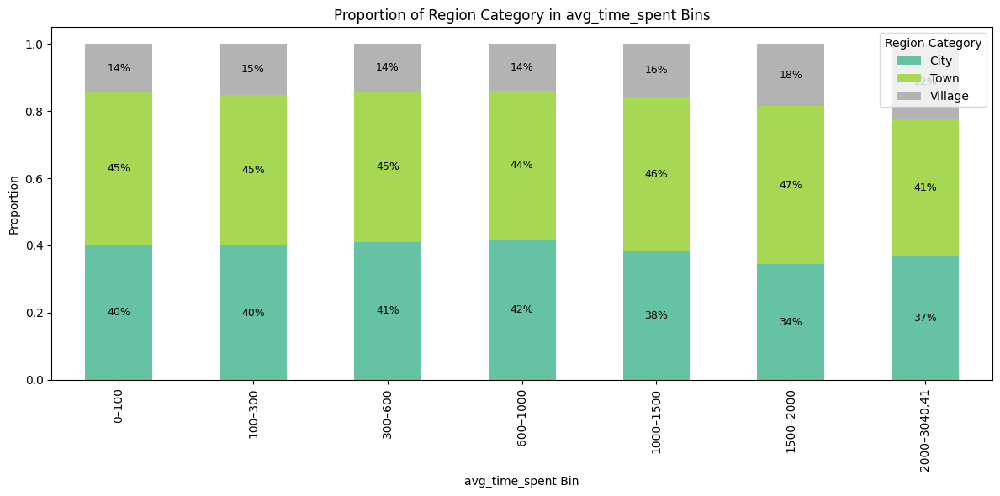

In [619]:


# Clean data
df_clean = df[['avg_time_spent', 'region_category']].dropna()

# Create bins
bins = [0, 100, 300, 600, 1000, 1500, 2000, df_clean['avg_time_spent'].max()]
labels = [f'{bins[i]}–{bins[i+1]}' for i in range(len(bins)-1)]
df_clean['time_bin'] = pd.cut(df_clean['avg_time_spent'], bins=bins, labels=labels, include_lowest=True)

# Group and normalize
grouped = df_clean.groupby(['time_bin', 'region_category']).size().unstack(fill_value=0)
proportions = grouped.div(grouped.sum(axis=1), axis=0)

# Plot
ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set2')
plt.title('Proportion of Region Category in avg_time_spent Bins')
plt.ylabel('Proportion')
plt.xlabel('avg_time_spent Bin')
plt.legend(title='Region Category')

# Add percentage labels
for i, bin_label in enumerate(proportions.index):
    bottom = 0
    for category in proportions.columns:
        value = proportions.loc[bin_label, category]
        if value > 0.01:  # Only show if >1%
            ax.text(i, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=9)
        bottom += value

plt.tight_layout()
plt.show()


- We tried to see maybe there is a correlation between the avg_transaction_value and the region_category.
- The idea was that people that have better membership will be in a better region, but we saw that the distribution of the data is not so different between the two columns (at least not something that was statistically significant)

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/2210645132.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



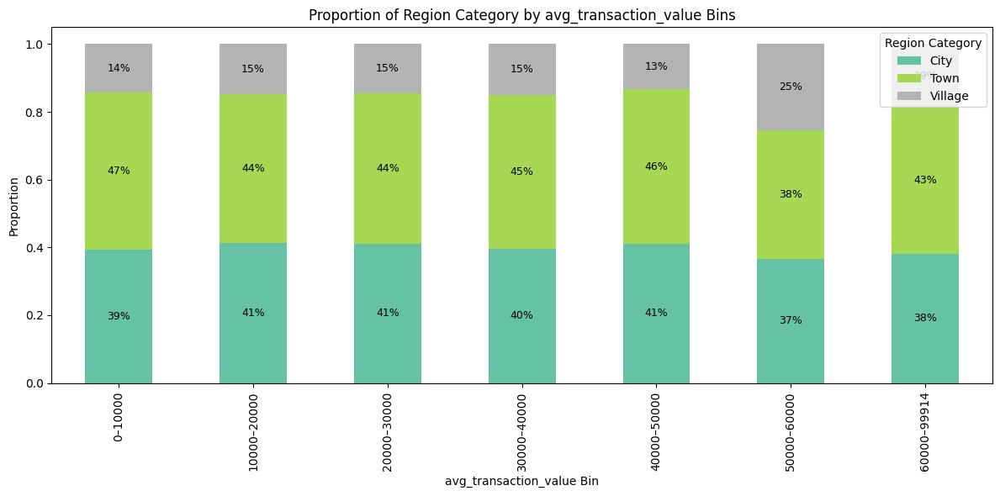

In [620]:
# Clean the data
df_clean = df[['avg_transaction_value', 'region_category']].dropna()

# Define bins for avg_transaction_value
bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
labels = [f'{bins[i]}–{bins[i+1]:.0f}' for i in range(len(bins)-1)]

# Create bin column
df_clean['transaction_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=bins, labels=labels, include_lowest=True)

# Group and normalize
grouped = df_clean.groupby(['transaction_bin', 'region_category']).size().unstack(fill_value=0)
proportions = grouped.div(grouped.sum(axis=1), axis=0)

# Plot
ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set2')
plt.title('Proportion of Region Category by avg_transaction_value Bins')
plt.ylabel('Proportion')
plt.xlabel('avg_transaction_value Bin')
plt.legend(title='Region Category')

# Add percentage labels
for i, bin_label in enumerate(proportions.index):
    bottom = 0
    for category in proportions.columns:
        value = proportions.loc[bin_label, category]
        if value > 0.01:
            ax.text(i, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=9)
        bottom += value

plt.tight_layout()
plt.show()


/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/1644024994.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



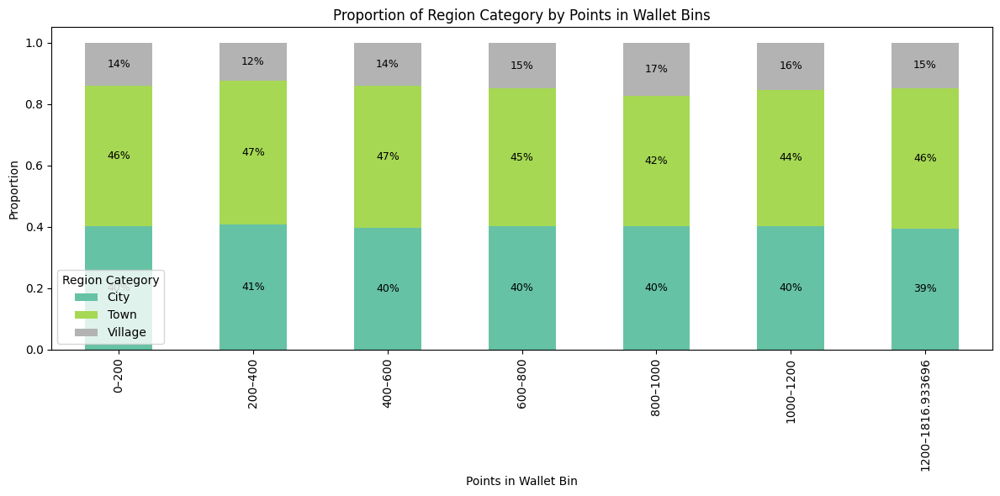

In [621]:
df_clean = df[['points_in_wallet', 'region_category']].dropna()

# Define bins for points_in_wallet
bins = [0, 200, 400, 600, 800, 1000, 1200, df_clean['points_in_wallet'].max()]
labels = [f'{bins[i]}–{bins[i+1]}' for i in range(len(bins)-1)]

# Create bin column
df_clean['wallet_bin'] = pd.cut(df_clean['points_in_wallet'], bins=bins, labels=labels, include_lowest=True)

# Count and normalize
grouped = df_clean.groupby(['wallet_bin', 'region_category']).size().unstack(fill_value=0)
proportions = grouped.div(grouped.sum(axis=1), axis=0)

# Plot
ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set2')
plt.title('Proportion of Region Category by Points in Wallet Bins')
plt.ylabel('Proportion')
plt.xlabel('Points in Wallet Bin')
plt.legend(title='Region Category')

# Add percentage labels
for i, bin_label in enumerate(proportions.index):
    bottom = 0
    for category in proportions.columns:
        value = proportions.loc[bin_label, category]
        if value > 0.01:
            ax.text(i, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=9)
        bottom += value

plt.tight_layout()
plt.show()


We tried to explore maybe multiple correlations between the columns, but we didn't find anything that was statistically significant 'avg_transaction_value', 'avg_time_spent' to explain the region_category

In [622]:
df_clean = df[['avg_transaction_value', 'avg_time_spent', 'region_category']].dropna()

# Define bins
tx_bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
time_bins = [0, 100, 300, 600, 1000, 1500, 2000, df_clean['avg_time_spent'].max()]

tx_labels = [f'{tx_bins[i]}–{int(tx_bins[i+1])}' for i in range(len(tx_bins)-1)]
time_labels = [f'{time_bins[i]}–{int(time_bins[i+1])}' for i in range(len(time_bins)-1)]

df_clean['tx_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=tx_bins, labels=tx_labels, include_lowest=True)
df_clean['time_bin'] = pd.cut(df_clean['avg_time_spent'], bins=time_bins, labels=time_labels, include_lowest=True)

# Group and calculate proportions
grouped = df_clean.groupby(['tx_bin', 'time_bin', 'region_category']).size().reset_index(name='count')
totals = grouped.groupby(['tx_bin', 'time_bin'])['count'].sum().reset_index(name='total')
merged = pd.merge(grouped, totals, on=['tx_bin', 'time_bin'])
merged['proportion'] = merged['count'] / merged['total']

# Create codes for 3D coordinates
merged['x'] = merged['tx_bin'].cat.codes
merged['y'] = merged['time_bin'].cat.codes
merged['z'] = merged['proportion']

# Prepare traces
fig = go.Figure()
colors = ['red', 'green', 'blue', 'orange', 'purple']
regions = merged['region_category'].unique()

for i, region in enumerate(regions):
    region_data = merged[merged['region_category'] == region]
    fig.add_trace(go.Scatter3d(
        x=region_data['x'],
        y=region_data['y'],
        z=region_data['z'],
        mode='markers',
        marker=dict(
            size=region_data['z'] * 50,  # Adjust marker size
            color=colors[i % len(colors)],
            opacity=0.8
        ),
        name=region
    ))

# Layout
fig.update_layout(
    title='3D Scatter of Region Category Proportions by Transaction & Time Spent',
    scene=dict(
        xaxis=dict(title='avg_transaction_value Bin', tickvals=list(range(len(tx_labels))), ticktext=tx_labels),
        yaxis=dict(title='avg_time_spent Bin', tickvals=list(range(len(time_labels))), ticktext=time_labels),
        zaxis=dict(title='Proportion')
    ),
    height=700,
    showlegend=True
)

fig.show()


/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3756786173.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3756786173.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



- We tried to see if there is a correlation with the ```features = ['age', 'gender', 'medium_of_operation', 'internet_option',
            'preferred_offer_types', 'avg_time_spent', 'avg_transaction_value',
            'avg_frequency_login_days', 'points_in_wallet']```
With the region_category column, but we didn't find anything that was statistically significant ( the purity level we got was to close to 0.5)

/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/envs/py310/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       0.34      0.01      0.02      1918
           1       0.45      0.99      0.62      2150
           2       0.00      0.00      0.00       712

    accuracy                           0.45      4780
   macro avg       0.26      0.33      0.21      4780
weighted avg       0.34      0.45      0.29      4780



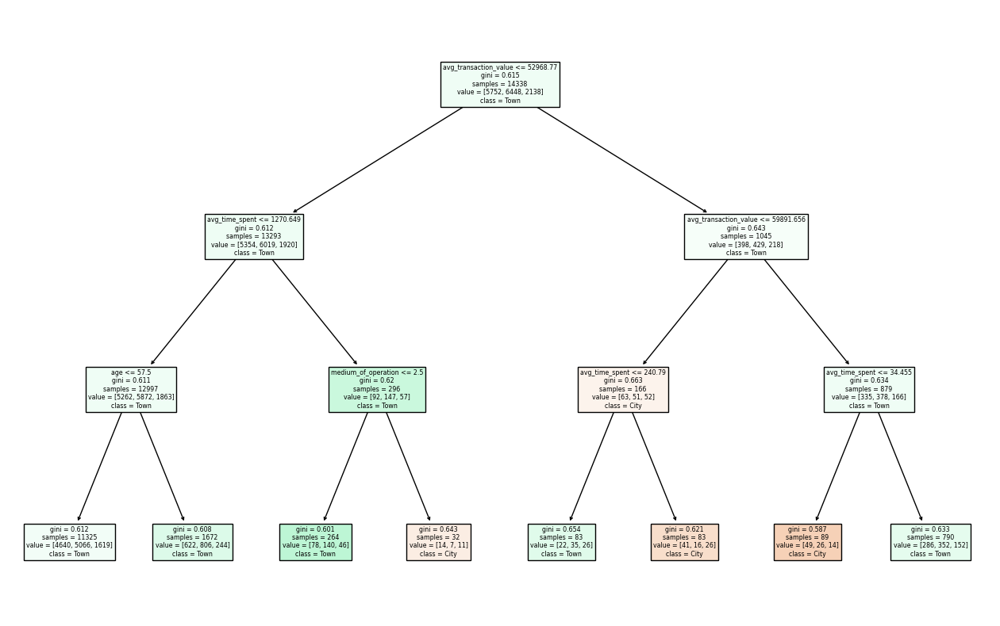

In [623]:
# Drop rows with missing 'region_category' (just for training the model)
df_train = df[df['region_category'].notnull()].copy()

# Select candidate features
features = ['age', 'gender', 'medium_of_operation', 'internet_option',
            'preferred_offer_types', 'avg_time_spent', 'avg_transaction_value',
            'avg_frequency_login_days', 'points_in_wallet']

# Encode categorical variables
df_encoded = df_train[features + ['region_category']].copy()
label_encoders = {}

for col in df_encoded.columns:
    if df_encoded[col].dtype == 'object':
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
        label_encoders[col] = le

# Train/test split
X = df_encoded[features]
y = df_encoded['region_category']
# Combine X and y for easy filtering
data = pd.concat([X, y], axis=1)

# Drop any rows with missing values in the feature columns
data_clean = data.dropna()

# Split back
X_clean = data_clean[features]
y_clean = data_clean['region_category']

X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, stratify=y_clean, random_state=42, )

# Train decision tree
clf = DecisionTreeClassifier(max_depth=3, random_state=0)
clf.fit(X_train, y_train)

# Evaluation
print(classification_report(y_test, clf.predict(X_test)))

# Plot tree (optional)
plt.figure(figsize=(16, 10))
plot_tree(clf, feature_names=features, class_names=label_encoders['region_category'].classes_, filled=True)
plt.show()


- Because we didn't find anything that was statistically significant, we decided to treat the region_category column missing values as a separate category, so we set the missing values to Unknown.
- Probably the region_category column is not so important for the model, but we wanted to see if we can find something that will help us to explain the data.

In [624]:
# filling missing region_category values with the unknown 
df.loc[df.region_category.isnull(), 'region_category'] = 'Unknown'

- We tried to see correlation between the numeric columns so it will help us to understand the data better
- 

In [625]:
# Select relevant columns
cols = ['age', 'days_since_last_login', 'avg_time_spent',
        'avg_transaction_value', 'points_in_wallet',]

# Calculate and round correlation
correlation = df[cols].corr().round(1)

# Plot heatmap
fig = px.imshow(correlation,
                text_auto=True,
                color_continuous_scale='RdBu',
                title='Correlation Heatmap (Rounded to 0.1)')

fig.show()


In [626]:

selected_cols = ['days_since_last_login', 'avg_time_spent', 'churn']
corr = df[selected_cols].corr().round(1)

fig = px.imshow(corr,
                text_auto=True,
                color_continuous_scale='RdBu',
                title='Correlation: Login Days, Time Spent & Churn')

fig.show()


In [627]:
# count how many rows have MISSING value in one of the columns
df.isnull().sum()[df.isnull().sum() > 0]

referral_id              11029
preferred_offer_types      208
medium_of_operation       3628
points_in_wallet          2287
dtype: int64

In [628]:
df.medium_of_operation.value_counts()

medium_of_operation
Smartphone    9388
Desktop       9228
Both          2540
Name: count, dtype: int64

#### Trying to explain the preferred_offer_types
- Trying to explore relationship between the preferred_offer_types and the columns (points_in_wallet, avg_transaction_value, region_category, data joined_through_referral and medium_of_operation.)

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3332383872.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



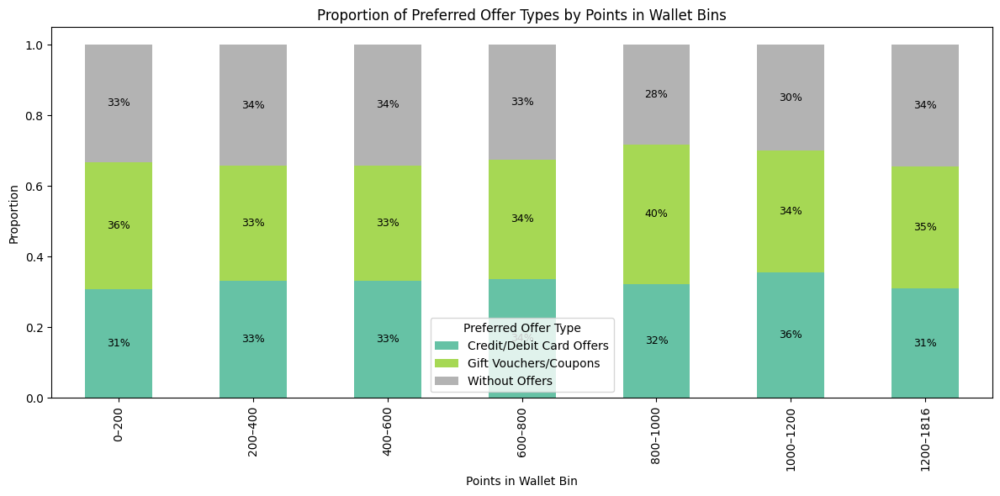

In [629]:
# Drop rows with missing values
df_clean = df[['points_in_wallet', 'preferred_offer_types']].dropna()

# Define bins for points_in_wallet
bins = [0, 200, 400, 600, 800, 1000, 1200, df_clean['points_in_wallet'].max()]
labels = [f'{bins[i]}–{int(bins[i+1])}' for i in range(len(bins)-1)]
df_clean['wallet_bin'] = pd.cut(df_clean['points_in_wallet'], bins=bins, labels=labels, include_lowest=True)

# Group and normalize
grouped = df_clean.groupby(['wallet_bin', 'preferred_offer_types']).size().unstack(fill_value=0)
proportions = grouped.div(grouped.sum(axis=1), axis=0)

# Plot
ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set2')
plt.title('Proportion of Preferred Offer Types by Points in Wallet Bins')
plt.ylabel('Proportion')
plt.xlabel('Points in Wallet Bin')
plt.legend(title='Preferred Offer Type')

# Add percentage labels
for i, bin_label in enumerate(proportions.index):
    bottom = 0
    for category in proportions.columns:
        value = proportions.loc[bin_label, category]
        if value > 0.01:
            ax.text(i, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=9)
        bottom += value

plt.tight_layout()
plt.show()


/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/456060532.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



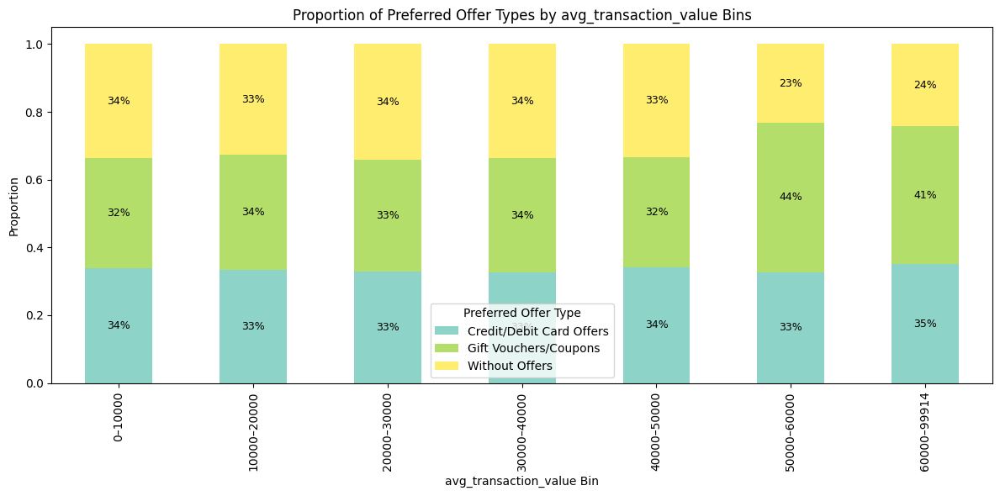

In [630]:
df_clean = df[['avg_transaction_value', 'preferred_offer_types']].dropna()

# Define bins for avg_transaction_value
bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
labels = [f'{int(bins[i])}–{int(bins[i+1])}' for i in range(len(bins)-1)]

# Create bin labels
df_clean['transaction_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=bins, labels=labels, include_lowest=True)

# Group and normalize
grouped = df_clean.groupby(['transaction_bin', 'preferred_offer_types']).size().unstack(fill_value=0)
proportions = grouped.div(grouped.sum(axis=1), axis=0)

# Plot
ax = proportions.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set3')
plt.title('Proportion of Preferred Offer Types by avg_transaction_value Bins')
plt.ylabel('Proportion')
plt.xlabel('avg_transaction_value Bin')
plt.legend(title='Preferred Offer Type')

# Add percentage labels inside each segment
for i, bin_label in enumerate(proportions.index):
    bottom = 0
    for category in proportions.columns:
        value = proportions.loc[bin_label, category]
        if value > 0.01:
            ax.text(i, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=9)
        bottom += value

plt.tight_layout()
plt.show()


/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3211794057.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3211794057.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3211794057.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc

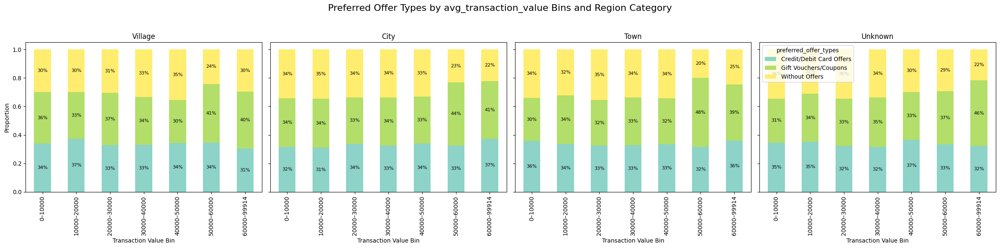

In [631]:
# Drop missing values 
df_clean = df[['avg_transaction_value', 'preferred_offer_types', 'region_category']].dropna()

# Define bins for avg_transaction_value
bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
labels = [f'{int(bins[i])}–{int(bins[i+1])}' for i in range(len(bins)-1)]
df_clean['transaction_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=bins, labels=labels, include_lowest=True)

# Get list of unique regions
regions = df_clean['region_category'].unique()

# Create subplots: one per region
fig, axes = plt.subplots(nrows=1, ncols=len(regions), figsize=(6 * len(regions), 6), sharey=True)

for i, region in enumerate(regions):
    region_df = df_clean[df_clean['region_category'] == region]
    
    # Group and normalize
    grouped = region_df.groupby(['transaction_bin', 'preferred_offer_types']).size().unstack(fill_value=0)
    proportions = grouped.div(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = axes[i] if len(regions) > 1 else axes
    proportions.plot(kind='bar', stacked=True, ax=ax, colormap='Set3', legend=(i == len(regions)-1))
    ax.set_title(f'{region}')
    ax.set_xlabel('Transaction Value Bin')
    if i == 0:
        ax.set_ylabel('Proportion')
    else:
        ax.set_ylabel('')
    
    # Add percentage labels
    for j, bin_label in enumerate(proportions.index):
        bottom = 0
        for category in proportions.columns:
            value = proportions.loc[bin_label, category]
            if value > 0.01:
                ax.text(j, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=8)
            bottom += value

fig.suptitle('Preferred Offer Types by avg_transaction_value Bins and Region Category', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/2732112148.py:30: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/2732112148.py:30: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/2732112148.py:30: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc

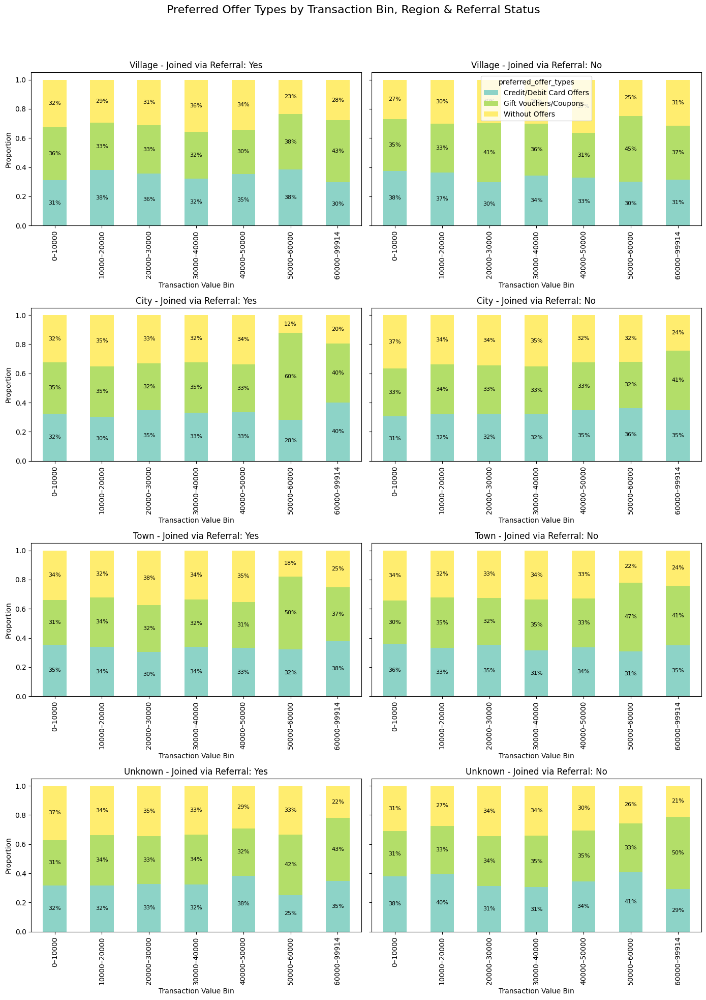

In [632]:
df_clean = df[['avg_transaction_value', 'preferred_offer_types', 'region_category', 'joined_through_referral']].dropna()

# Normalize 'joined_through_referral' to strings ('Yes', 'No') if needed
if df_clean['joined_through_referral'].dtype != 'object':
    df_clean['joined_through_referral'] = df_clean['joined_through_referral'].map({1: 'Yes', 0: 'No'})

# Define bins for avg_transaction_value
bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
labels = [f'{int(bins[i])}–{int(bins[i+1])}' for i in range(len(bins)-1)]
df_clean['transaction_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=bins, labels=labels, include_lowest=True)

# Get all unique combinations of region and referral
regions = df_clean['region_category'].unique()
referral_status = ['Yes', 'No']
n_cols = len(referral_status)
n_rows = len(regions)

# Set up the plot
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(7 * n_cols, 5 * n_rows), sharey=True)

for i, region in enumerate(regions):
    for j, referral in enumerate(referral_status):
        subset = df_clean[(df_clean['region_category'] == region) & 
                          (df_clean['joined_through_referral'] == referral)]
        
        ax = axes[i, j] if n_rows > 1 else axes[j]
        
        if not subset.empty:
            # Group and normalize
            grouped = subset.groupby(['transaction_bin', 'preferred_offer_types']).size().unstack(fill_value=0)
            proportions = grouped.div(grouped.sum(axis=1), axis=0)

            # Plot
            proportions.plot(kind='bar', stacked=True, ax=ax, colormap='Set3', legend=(i == 0 and j == 1))
            
            ax.set_title(f"{region} - Joined via Referral: {referral}")
            ax.set_xlabel('Transaction Value Bin')
            if j == 0:
                ax.set_ylabel('Proportion')

            # Add percentage labels
            for k, bin_label in enumerate(proportions.index):
                bottom = 0
                for offer in proportions.columns:
                    value = proportions.loc[bin_label, offer]
                    if value > 0.01:
                        ax.text(k, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=8)
                    bottom += value
        else:
            ax.set_title(f"{region} - Joined via Referral: {referral}")
            ax.set_xlabel('Transaction Value Bin')
            ax.set_ylabel('Proportion')
            ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
                    ha='center', va='center', fontsize=12, color='gray')

# Final layout
fig.suptitle('Preferred Offer Types by Transaction Bin, Region & Referral Status', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


- We could not find correlation between the preferred_offer_types and the columns (points_in_wallet, avg_transaction_value, region_category, data joined_through_referral and medium_of_operation.)
- So we decided to ignore the preferred_offer_types missing values because it is less the 1%  of the data

### Trying to explain the medium_of_operation

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3685158694.py:34: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3685158694.py:34: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc0000gn/T/ipykernel_5235/3685158694.py:34: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/27/h86gj_fd3xg23kmxw_95c6kc

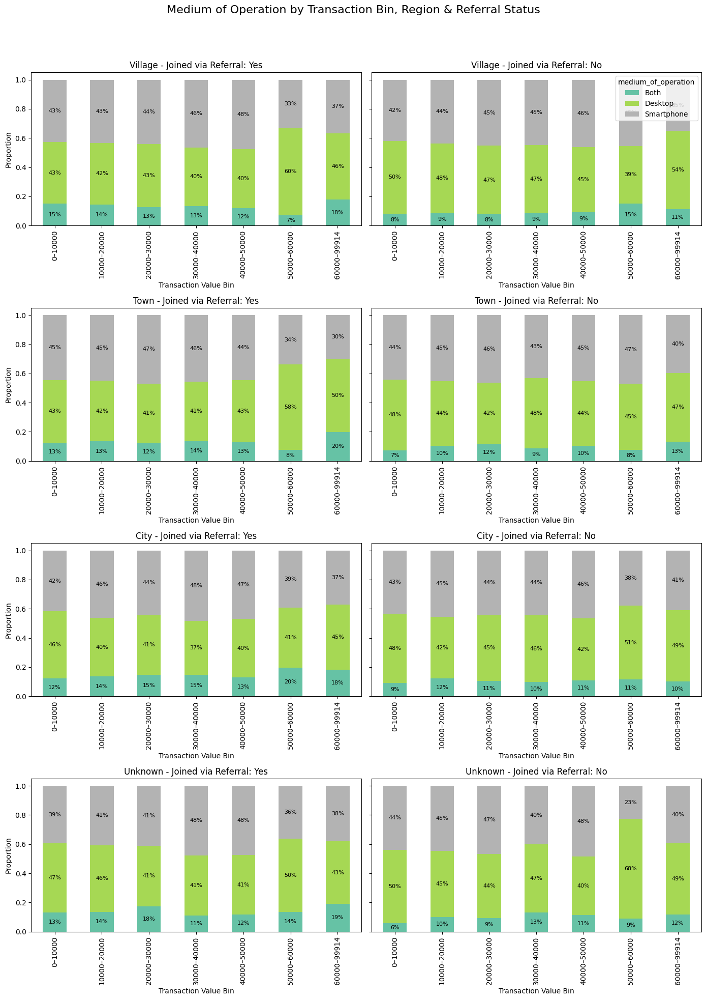

In [633]:
import pandas as pd
import matplotlib.pyplot as plt

# Clean and prepare 
df_clean = df[['avg_transaction_value', 'medium_of_operation', 'region_category', 'joined_through_referral']].dropna()

# Normalize 'joined_through_referral' to strings
if df_clean['joined_through_referral'].dtype != 'object':
    df_clean['joined_through_referral'] = df_clean['joined_through_referral'].map({1: 'Yes', 0: 'No'})

# Define bins for avg_transaction_value
bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()]
labels = [f'{int(bins[i])}–{int(bins[i+1])}' for i in range(len(bins)-1)]
df_clean['transaction_bin'] = pd.cut(df_clean['avg_transaction_value'], bins=bins, labels=labels, include_lowest=True)

# Get all unique combinations
regions = df_clean['region_category'].unique()
referral_status = ['Yes', 'No']
n_cols = len(referral_status)
n_rows = len(regions)

# Set up the plot
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(7 * n_cols, 5 * n_rows), sharey=True)

for i, region in enumerate(regions):
    for j, referral in enumerate(referral_status):
        subset = df_clean[(df_clean['region_category'] == region) &
                          (df_clean['joined_through_referral'] == referral)]

        ax = axes[i, j] if n_rows > 1 else axes[j]

        if not subset.empty:
            # Group and normalize
            grouped = subset.groupby(['transaction_bin', 'medium_of_operation']).size().unstack(fill_value=0)
            proportions = grouped.div(grouped.sum(axis=1), axis=0)

            # Plot
            proportions.plot(kind='bar', stacked=True, ax=ax, colormap='Set2', legend=(i == 0 and j == 1))

            ax.set_title(f"{region} - Joined via Referral: {referral}")
            ax.set_xlabel('Transaction Value Bin')
            if j == 0:
                ax.set_ylabel('Proportion')

            # Add percentage labels
            for k, bin_label in enumerate(proportions.index):
                bottom = 0
                for category in proportions.columns:
                    value = proportions.loc[bin_label, category]
                    if value > 0.01:
                        ax.text(k, bottom + value / 2, f'{value:.0%}', ha='center', va='center', fontsize=8)
                    bottom += value
        else:
            ax.set_title(f"{region} - Joined via Referral: {referral}")
            ax.set_xlabel('Transaction Value Bin')
            ax.set_ylabel('Proportion')
            ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
                    ha='center', va='center', fontsize=12, color='gray')

# Final layout
fig.suptitle('Medium of Operation by Transaction Bin, Region & Referral Status', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Trying to fill the medium_of_operation  
- trying to see relation between the avg_transaction_value and the medium_of_operation


In [634]:
# df[(df.avg_transaction_value > 50_000) & (df.avg_transaction_value < 60_000) ].medium_of_operation.isnull().sum()
# for each bin bins = [0, 10000, 20000, 30000, 40000, 50000, 60000, df_clean['avg_transaction_value'].max()] of avg_transaction_value
# we will create a graph of the amount of missing values in the medium_of_operation
arr = []
for i in range(len(bins)-1):
    # get the min and max of the bin
    min_bin = bins[i]
    max_bin = bins[i+1]
    # get the rows that are in the bin
    df_bin = df[(df.avg_transaction_value > min_bin) & (df.avg_transaction_value < max_bin)]
    # get the amount of missing values in the medium_of_operation
    missing_values = df_bin.medium_of_operation.isnull().sum()
    arr.append(missing_values)

fig = px.bar(x=[f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-1)], y=arr, title='Missing values in medium_of_operation by transaction value')
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(title_x=0.5, xaxis_title='avg_transaction_value bins', yaxis_title='Missing values in medium_of_operation')
fig.show()

- We did find correlation so we fill the columns with the proportion of the data of the avg_transaction_value

In [635]:
# we fill the medium_of_operation with the proportion of bins of the avg_transaction_value
# for each bin we will get the proportion of the medium_of_operation and fill the missing values by the proportion (randomly)
for i in range(len(bins)-1):
    # get the min and max of the bin
    min_bin = bins[i]
    max_bin = bins[i+1]
    # get the rows that are in the bin
    df_bin = df[(df.avg_transaction_value > min_bin) & (df.avg_transaction_value < max_bin)]
    # get the amount of missing values in the medium_of_operation
    missing_values = df_bin.medium_of_operation.isnull().sum()
    # get the proportion of the medium_of_operation
    proportions = df_bin.medium_of_operation.value_counts(normalize=True)
    # fill the missing values by the proportion (randomly)
    df.loc[(df.avg_transaction_value >= min_bin) & (df.avg_transaction_value < max_bin) & (df.medium_of_operation.isnull()), 'medium_of_operation'] = np.random.choice(proportions.index, size=missing_values, p=proportions.values)

### Visualization some of the data and normalize the data

- We tried to see correlation between the ```selected_cols = ['days_since_last_login', 'avg_time_spent', 'churn']
``` and the churn.

In [636]:

selected_cols = ['days_since_last_login', 'avg_time_spent', 'churn']
corr = df[selected_cols].corr().round(1)

fig = px.imshow(corr,
                text_auto=True,
                color_continuous_scale='RdBu',
                title='Correlation: Login Days, Time Spent & Churn')

fig.show()


In [637]:
# scatter plot of avg_transaction_value and points_in_wallet with plotly
fig = px.scatter(df, x='avg_transaction_value', y='points_in_wallet',
                 title='Scatter plot of avg_transaction_value and points_in_wallet')
fig.update_traces(marker=dict(size=5, opacity=0.5))
fig.update_layout(title_x=0.5)
fig.show()

In [638]:
fig = px.histogram(df, x='points_in_wallet', color='membership_category' ,nbins=30, title='Points in Wallet Distribution')
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(title_x=0.5)
fig.show()


In [639]:
list(df.complaint_status.value_counts().index)

['Not Applicable',
 'Unsolved',
 'Solved',
 'Solved in Follow-up',
 'No Information Available']

In [640]:
df.columns

Index(['ID', 'customer_id', 'Name', 'age', 'gender', 'security_no',
       'region_category', 'membership_category', 'joining_date',
       'joined_through_referral', 'referral_id', 'preferred_offer_types',
       'medium_of_operation', 'internet_option', 'days_since_last_login',
       'avg_time_spent', 'avg_transaction_value', 'avg_frequency_login_days',
       'points_in_wallet', 'used_special_discount',
       'offer_application_preference', 'past_complaint', 'complaint_status',
       'feedback', 'churn', 'is_male'],
      dtype='object')

In [641]:
# is_consistent = ((df['past_complained'] == 0) == (df['complaint_status'] == 'Not Applicable')).all()
# print("all of 'not applicable' didn't complained and vise versa: ", is_consistent)

# # Check if all rows where the 'complaint_status' is 'No Information Available' have 'past_complained' as 1 (meaning they complained)
# condition = df[df['complaint_status'] == 'No Information Available']['past_complained'] == 1
# all_complained = condition.all()  # If all these rows complained (1), 'all_complained' will be True
# print("all of 'no information available' complained: ", all_complained)

# # Replace 'Not Applicable' with 'No Complain'
# df['complaint_status'] = df['complaint_status'].replace('Not Applicable', 'No Complain')

# # Replace 'No Information Available' with 'Unknown'
# df['complaint_status'] = df['complaint_status'].replace('No Information Available', 'Unknown')


# set the rows where the past_complaint is 0 to have complaint_status as 'Not Applicable'
df.loc[df['past_complaint'] == 0, 'complaint_status'] = 'Not Applicable'
# set the rows when the complaint_status is Not Applicable to have past_complaint as 0
df.loc[df['complaint_status'] == 'Not Applicable', 'past_complaint'] = 0


In [642]:
# bar chart of df.complaint_status.value_counts()
fig = px.bar(df, x=list(df.complaint_status.value_counts().index), y=df.complaint_status.value_counts().values,
             title='Complaint Status Distribution')

fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(title_x=0.5)
fig.show()

In [643]:
df.describe()

,ID,age,joined_through_referral,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,churn,is_male
count,24784.000000,24784.000000,24784.000000,24784.000000,24784.000000,24784.000000,24784.000000,22497.000000,24784.000000,24784.000000,24784.000000,24784.000000,24784.000000
mean,18467.497014,36.986967,0.554995,12.728832,313.353383,29307.237880,16.436693,689.670988,0.549306,0.553422,0.495118,0.265655,0.495441
std,10660.308320,15.860701,0.496976,5.425542,341.538308,19436.878248,8.003645,185.573158,0.497573,0.497148,0.499986,0.441690,0.499989
min,0.000000,10.000000,0.000000,1.000000,12.338460,800.460000,0.006221,6.432208,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9262.750000,23.000000,0.000000,9.000000,75.635000,14194.192500,10.000000,617.140000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,18495.500000,37.000000,1.000000,12.728832,185.765000,27612.555000,16.436693,697.480000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,27676.250000,51.000000,1.000000,16.000000,414.080000,40862.025000,22.000000,763.470000,1.000000,1.000000,1.000000,1.000000,1.000000
max,36989.000000,64.000000,1.000000,26.000000,3040.410000,99914.050000,67.062422,1816.933696,1.000000,1.000000,1.000000,1.000000,1.000000


In [644]:
# normalize columns column_name_normalized

In [645]:

histogram_plot(df, 'age')
df['age_normalized'] = (df['age'] - df['age'].min()) / (df['age'].max() - df['age'].min()) # we choose this because the age distributed pretty uniformly
histogram_plot(df, 'age_normalized')

In [646]:
histogram_plot(df, 'days_since_last_login')
df['days_since_last_login_normalized'] = (df['days_since_last_login'] - df['days_since_last_login'].mean())/( df['days_since_last_login'].std()) # we choose this because the days_since_last_login distributed pretty normally
histogram_plot(df, 'days_since_last_login_normalized')

In [647]:
histogram_plot(df, 'avg_time_spent')
df['avg_time_spent_normalized'] = np.log1p(df['avg_time_spent'])
# df['avg_time_spent_normalized'] = MinMaxScaler().fit_transform(df[['avg_time_spent_log']])
histogram_plot(df, 'avg_time_spent_normalized')
# histogram_plot(df, 'avg_time_spent_normalized', 15)

# also normalize by minmax

df['avg_time_spent_normalized_minmax'] = MinMaxScaler().fit_transform(df[['avg_time_spent']]) # (df['avg_time_spent'] - df['avg_time_spent'].min()) / (df['avg_time_spent'].max() - df['avg_time_spent'].min())

histogram_plot(df, 'avg_time_spent_normalized_minmax', 20)

In [648]:
histogram_plot(df, 'avg_transaction_value')
from sklearn.preprocessing import MinMaxScaler
# lp normalize the avg_transaction_value
 
import numpy as np

df['avg_transaction_value_log'] = np.log1p(df['avg_transaction_value'])
df['avg_transaction_value_normalized'] = MinMaxScaler().fit_transform(
    df[['avg_transaction_value']]
)# df['avg_transaction_value_normalized'] = np.log1p(df[['avg_transaction_value_log']])
histogram_plot(df, 'avg_transaction_value_normalized', 10)

# normalize by min max
df['points_in_wallet_normalized'] = MinMaxScaler().fit_transform(df[['points_in_wallet']])
histogram_plot(df, 'points_in_wallet_normalized', 15)


In [649]:
histogram_plot(df, 'points_in_wallet')
# normalize by normal distribution
df['points_in_wallet_normalized'] = (df['points_in_wallet'] - df['points_in_wallet'].mean())/( df['points_in_wallet'].std())

# fill the missing values in points_in_wallet_normalized with the random values with the mean and std deviation
df.loc[df['points_in_wallet_normalized'].isnull(), 'points_in_wallet_normalized'] = np.random.normal(df['points_in_wallet_normalized'].mean(), df['points_in_wallet_normalized'].std(), size=len(df[df['points_in_wallet_normalized'].isnull()]))
histogram_plot(df, 'points_in_wallet_normalized')

In [650]:
# Step 4: Fill NaN (former 'Error') with mean of the column
mean_val = df['avg_frequency_login_days'].mean()
df['avg_frequency_login_days'] = df['avg_frequency_login_days'].fillna(mean_val)
histogram_plot(df, 'avg_frequency_login_days')

# Normalize the column by min max because normal distribution because change the data distribution
# df['avg_frequency_login_days_normalized'] = (df['avg_frequency_login_days'] - df['avg_frequency_login_days'].mean())/( df['avg_frequency_login_days'].std())
df['avg_frequency_login_days_normalized'] = (df['avg_frequency_login_days'] - df['avg_frequency_login_days'].min()) / (df['avg_frequency_login_days'].max() - df['avg_frequency_login_days'].min())
histogram_plot(df, 'avg_frequency_login_days_normalized', )

In [651]:
df.drop(columns=['customer_id', 'Name', 'gender', 'security_no', 'age'
                 ,'days_since_last_login', 'avg_time_spent', 'avg_transaction_value'
                 ,'points_in_wallet', 'avg_frequency_login_days'], inplace=True)
df.columns  

Index(['ID', 'region_category', 'membership_category', 'joining_date',
       'joined_through_referral', 'referral_id', 'preferred_offer_types',
       'medium_of_operation', 'internet_option', 'used_special_discount',
       'offer_application_preference', 'past_complaint', 'complaint_status',
       'feedback', 'churn', 'is_male', 'age_normalized',
       'days_since_last_login_normalized', 'avg_time_spent_normalized',
       'avg_time_spent_normalized_minmax', 'avg_transaction_value_log',
       'avg_transaction_value_normalized', 'points_in_wallet_normalized',
       'avg_frequency_login_days_normalized'],
      dtype='object')

In [652]:
# avg_frequency_login_days_before

* For the feedback columns, we see the number of unique values, the top value and the frequency of that value

In [653]:
df.feedback.value_counts()

feedback
Poor Product Quality        4309
Too many ads                4238
Poor Customer Service       4210
Poor Website                4206
No reason specified         4128
User Friendly Website        940
Reasonable Price             937
Products always in Stock     934
Quality Customer Care        882
Name: count, dtype: int64

In [654]:
df.medium_of_operation.unique() # transform to (1,0) desktop, (0,1) mobile , (1,1) both
df['medium_of_operation'] = df['medium_of_operation'].apply(lambda x: (1, 0) if x.lower() == 'desktop' else (0, 1) if x.lower() == 'mobile' else (1, 1))
print(df.medium_of_operation.value_counts())
df['medium_of_operation_dim1'] = df['medium_of_operation'].apply(lambda x: x[0])
df['medium_of_operation_dim2'] = df['medium_of_operation'].apply(lambda x: x[1])
df.drop(columns=['medium_of_operation'], inplace=True)


medium_of_operation
(1, 1)    13964
(1, 0)    10820
Name: count, dtype: int64


In [655]:
import numpy as np
from sklearn.preprocessing import OneHotEncoder

# # Define your labels
# labels = np.array(['Mobile_Data', 'Wi-Fi', 'Fiber_Optic'])

# # Reshape for sklearn (expects 2D input)
# labels = labels.reshape(-1, 1)

# # Create and fit the encoder
# encoder = OneHotEncoder(sparse=False)
# encoded_labels = encoder.fit_transform(labels)

# def mobile_data_to_one_hot(x):
#     if x == 'Mobile_Data':
#         return (1, 0, 0)
#     elif x == 'Wi-Fi':
#         return (0, 1, 0)
#     elif x == 'Fiber_Optic':
#         return (0, 0, 1)
#     else:
#         return (0, 0, 0)  # Default case for unexpected values
# df['internet_option'] = df['internet_option'].apply(mobile_data_to_one_hot)
# df['internet_option_dim1'] = df['internet_option'].apply(lambda x: x[0])
# df['internet_option_dim2'] = df['internet_option'].apply(lambda x: x[1])
# df['internet_option_dim3'] = df['internet_option'].apply(lambda x: x[2])
# df.drop(columns=['internet_option'], inplace=True)


def mobile_data_to_one_hot(x):
    if x == 'Mobile_Data':
        return 1
    elif x == 'Wi-Fi':
        return 0
    elif x == 'Fiber_Optic':
        return  -1
    else:
        return 0  # Default case for unexpected values
df['internet_option'] = df['internet_option'].apply(mobile_data_to_one_hot)
df['internet_option_dim1'] = df['internet_option'].apply(lambda x: x)
df['internet_option_dim2'] = df['internet_option'].apply(lambda x: x)
df['internet_option_dim3'] = df['internet_option'].apply(lambda x: x)
df.drop(columns=['internet_option'], inplace=True)




In [656]:
df.feedback.unique()

array(['Poor Product Quality', 'Too many ads', 'No reason specified',
       'Products always in Stock', 'Poor Customer Service',
       'Reasonable Price', 'User Friendly Website', 'Poor Website',
       'Quality Customer Care'], dtype=object)

In [657]:
df[df['churn'] == 1].feedback.value_counts()

feedback
Poor Product Quality     1337
Too many ads             1329
Poor Customer Service    1321
No reason specified      1314
Poor Website             1283
Name: count, dtype: int64

In [658]:
df.feedback.value_counts()

feedback
Poor Product Quality        4309
Too many ads                4238
Poor Customer Service       4210
Poor Website                4206
No reason specified         4128
User Friendly Website        940
Reasonable Price             937
Products always in Stock     934
Quality Customer Care        882
Name: count, dtype: int64

In [659]:
# len(df[(df['churn'] == 1) & (df['feedback'] == 'Poor Product Quality')]) / len(df[df['feedback'] == 'Poor Product Quality'])

In [660]:
# len(df[(df['churn'] == 1)]) / len(df)

In [661]:
# transform # scale No Membership, Basic, Sliver, Gold, Platinum , and then Premium the values are between 0 and 1
df['membership_category'] = df['membership_category'].apply(lambda x: 0 if x == 'No Membership' else 0.2 if x == 'Basic' else 0.4 if x == 'Silver' else 0.6 if x == 'Gold' else 0.8 if x == 'Platinum' else 1.0 if x == 'Premium' else np.nan)


In [662]:
# # for the join date we will use the year and calculate the amount of time they use our service in years
# # Convert to datetime
# df['joining_date'] = pd.to_datetime(df['joining_date'], errors='coerce')  # coerce handles bad formats as NaT

# # Now extract year and calculate service duration
# df['service_duration'] = 2020 - df['joining_date'].dt.year



In [663]:
# # count hoe many missing values in the joining_date column
# df['joining_date'].isnull().sum()
# # df.joining_date()

In [664]:
# df.preferred_offer_types.value_counts()
# # create a new values for the values preferred_offer_types Gift Vouchers/Coupons = (1,0) . Credit/Debit Card Offers =(0,1) . Without Offers (0,0)
# df['preferred_offer_types'] = df['preferred_offer_types'].apply(lambda x: (1, 0) if x == 'Gift Vouchers/Coupons' else (0, 1) if x == 'Credit/Debit Card Offers' else (0, 0))

# df['preferred_offer_types_dim1'] = df['preferred_offer_types'].apply(lambda x: x[0])
# df['preferred_offer_types_dim2'] = df['preferred_offer_types'].apply(lambda x: x[1])
# df.drop(columns=['preferred_offer_types'], inplace=True)



df.preferred_offer_types.value_counts()
# create a new values for the values preferred_offer_types Gift Vouchers/Coupons = (1,0) . Credit/Debit Card Offers =(0,1) . Without Offers (0,0)
df['preferred_offer_types'] = df['preferred_offer_types'].apply(lambda x: 1 if x == 'Gift Vouchers/Coupons' else -1 if x == 'Credit/Debit Card Offers' else 0)

df['preferred_offer_types_dim1'] = df['preferred_offer_types'].apply(lambda x: 1 if x == 1 else 0)
df['preferred_offer_types_dim2'] = df['preferred_offer_types'].apply(lambda x: 1 if x == -1 else 0)
df.drop(columns=['preferred_offer_types'], inplace=True)


In [665]:
df[df['churn'] == 1].feedback.value_counts()
# create 2d array for the feedback column
# where Poor Product Quality = (1,0,0) , Poor Website (1 , 0 , 0)
# # To many ads = (1,0,0) , Poor customer service = (0,1,0)
# No reason = (0,0,0)
# other = (0,0,0)

def feedback_to_tuple(feedback):
    feedback = feedback.lower()
    if feedback == 'poor product quality':
        return (1, 0, 0)
    elif feedback == 'poor website':
        return (0, 1, 0)
    elif feedback == 'too many ads':
        return (0, 0, 1)
    elif feedback == 'poor customer service':
        return (0, 1, 0)
    # elif feedback == 'no reason':
    #     return (0, 0, 0)
    else:
        return (0, 0, 0)  # for other cases
df['feedback'] = df['feedback'].apply(feedback_to_tuple)
df['feedback_dim1'] = df['feedback'].apply(lambda x: x[0])
df['feedback_dim2'] = df['feedback'].apply(lambda x: x[1])
df['feedback_dim3'] = df['feedback'].apply(lambda x: x[2])
df.drop(columns=['feedback'], inplace=True)



# def feedback_to_tuple(feedback):
#     feedback = feedback.lower()
#     if feedback in ['poor product quality', 'poor website', 'too many ads', 'poor customer service']:
#         return -1
#     elif feedback in ['user friendly website', 'reasonable price', 'product always in stock', 'quality customer care']:
#         return 1
    
#     return 0  # for other cases, including 'no reason' or any unexpected values


# df['feedback'] = df['feedback'].apply(feedback_to_tuple)
# df['feedback_dim1'] = df['feedback'].apply(lambda x: x)
# df['feedback_dim2'] = df['feedback'].apply(lambda x: x)
# df['feedback_dim3'] = df['feedback'].apply(lambda x: x)
# df.drop(columns=['feedback'], inplace=True)

In [666]:
# create numeric values for the region_category column village = 0, town = 1, city = 2 , unknown = 1.5
df['region_category'] = df['region_category'].map({
    'Village': 0,
    'Town': 1,
    'City': 2,
    'Unknown': 1.5
})
# min max scale the region_category column
df['region_category'] = (df['region_category'] - df['region_category'].min()) / (df['region_category'].max() - df['region_category'].min())
df.region_category.value_counts()

region_category
0.50    9476
1.00    8495
0.75    3697
0.00    3116
Name: count, dtype: int64

In [667]:
# df.feedback.value_counts()

In [668]:
df.columns

Index(['ID', 'region_category', 'membership_category', 'joining_date',
       'joined_through_referral', 'referral_id', 'used_special_discount',
       'offer_application_preference', 'past_complaint', 'complaint_status',
       'churn', 'is_male', 'age_normalized',
       'days_since_last_login_normalized', 'avg_time_spent_normalized',
       'avg_time_spent_normalized_minmax', 'avg_transaction_value_log',
       'avg_transaction_value_normalized', 'points_in_wallet_normalized',
       'avg_frequency_login_days_normalized', 'medium_of_operation_dim1',
       'medium_of_operation_dim2', 'internet_option_dim1',
       'internet_option_dim2', 'internet_option_dim3',
       'preferred_offer_types_dim1', 'preferred_offer_types_dim2',
       'feedback_dim1', 'feedback_dim2', 'feedback_dim3'],
      dtype='object')

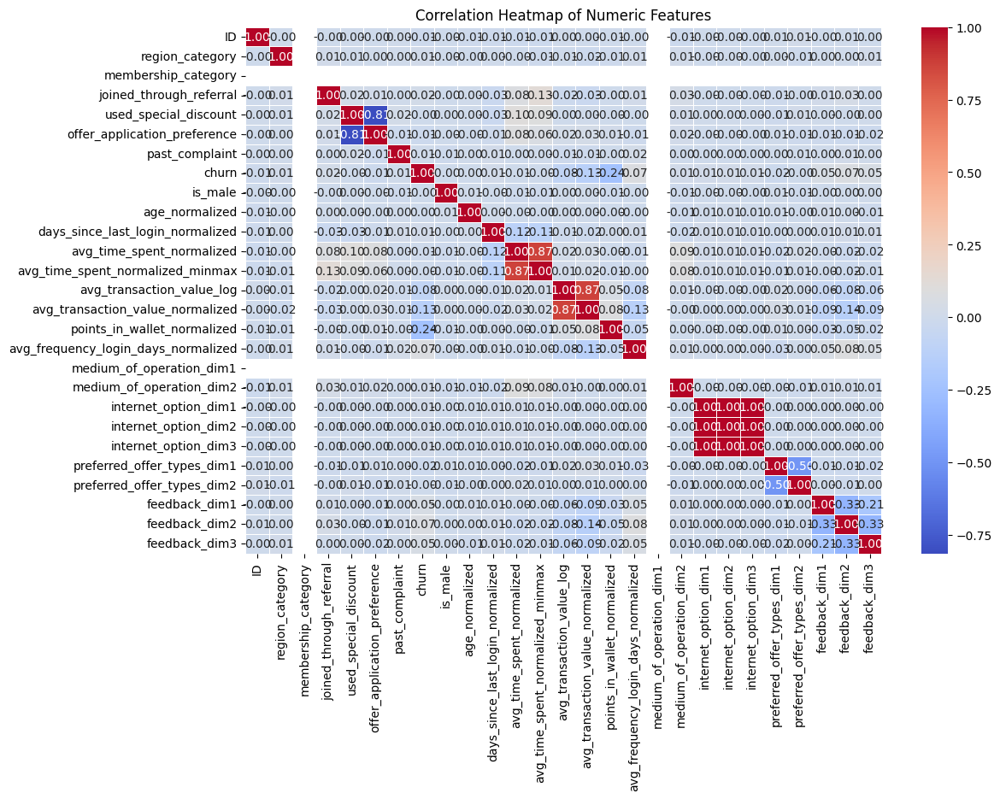

In [669]:
# select all numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# create heatmap of the numeric columns with plotly
import plotly.express as px
fig = px.imshow(df[numeric_cols].corr(), text_auto=True, color_continuous_scale='RdBu',
                title='Correlation Heatmap of Numeric Columns')
fig.update_layout(title_x=0.5)
fig.show()


# create also with seaborn
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(df[numeric_cols].corr(), annot=True, fmt=".2f",
            cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()


In [670]:
# ...existing code...
HEATMAP_COLUMNS = [
    'region_category',
    'membership_category',
    'joined_through_referral',
    'used_special_discount',
    'offer_application_preference',
    'past_complaint',
    'churn',
    'is_male',
    'age_normalized',
    'days_since_last_login_normalized',
    'avg_time_spent_normalized',
    'avg_time_spent_normalized_minmax',
    'avg_transaction_value_log',
    'avg_transaction_value_normalized',
    'points_in_wallet_normalized',
    'avg_frequency_login_days_normalized',
    'medium_of_operation_dim1',
    'medium_of_operation_dim2',
    'internet_option_dim1',
    'internet_option_dim2',
    'internet_option_dim3',
    'preferred_offer_types_dim1',
    'preferred_offer_types_dim2',
    'feedback_dim1',
    'feedback_dim2',
    'feedback_dim3'
]

fig = px.imshow(df[HEATMAP_COLUMNS].corr(), text_auto=True, color_continuous_scale='RdBu',
                title='Correlation Heatmap of Numeric Columns')
fig.update_layout(title_x=0.5)
fig.show()


In [671]:
df.drop(columns=[ 'referral_id', ], inplace=True)
df.to_csv('../Final project Part 2/churn_dataset_train_cleaned.csv', index=False)

In [672]:
print("Hello, World!")

Hello, World!
